<table align="left"><tr><td>
<a href="https://colab.research.google.com/github/rickiepark/nlp-with-transformers/blob/main/09_lookup-table-with-faiss.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="코랩에서 실행하기"/></a>
</td></tr></table>

**이 노트북은 9장 '임베딩을 룩업 테이블로 사용하기' 절의 코드를 담고 있습니다.**

In [1]:
# 최신 라이브러리를 설치합니다.
# !pip install transformers datasets faiss-cpu scikit-multilearn

In [1]:
# 필요한 패키지를 임포트합니다.
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

### 9.1.1 데이터 다운로드 하기 (326p)

데이터를 다운로드합니다.

In [16]:
import pandas as pd

dataset_url = "https://git.io/nlp-with-transformers"
df_issues = pd.read_json(dataset_url, lines=True)
df_issues.head()

,url,repository_url,labels_url,comments_url,events_url,html_url,id,node_id,number,title,...,milestone,comments,created_at,updated_at,closed_at,author_association,active_lock_reason,body,performed_via_github_app,pull_request
0,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://github.com/huggingface/transformers/is...,849568459,MDU6SXNzdWU4NDk1Njg0NTk=,11046,Potential incorrect application of layer norm ...,...,NaN,0,2021-04-03 03:37:32,2021-04-03 03:37:32,NaT,NONE,None,"In BlenderbotSmallDecoder, layer norm is appl...",NaN,None
1,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://github.com/huggingface/transformers/is...,849544374,MDU6SXNzdWU4NDk1NDQzNzQ=,11045,Multi-GPU seq2seq example evaluation significa...,...,NaN,0,2021-04-03 00:52:24,2021-04-03 00:52:24,NaT,NONE,None,\r\n### Who can help\r\n@patil-suraj @sgugger ...,NaN,None
2,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://github.com/huggingface/transformers/is...,849529761,MDU6SXNzdWU4NDk1Mjk3NjE=,11044,[DeepSpeed] ZeRO stage 3 integration: getting ...,...,NaN,0,2021-04-02 23:40:42,2021-04-03 00:00:18,NaT,COLLABORATOR,None,"**[This is not yet alive, preparing for the re...",NaN,None
3,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://github.com/huggingface/transformers/is...,849499734,MDU6SXNzdWU4NDk0OTk3MzQ=,11043,Can't load model to estimater,...,NaN,0,2021-04-02 21:51:44,2021-04-02 21:51:44,NaT,NONE,None,I was trying to follow the Sagemaker instructi...,NaN,None
4,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://github.com/huggingface/transformers/is...,849274362,MDU6SXNzdWU4NDkyNzQzNjI=,11042,[LXMERT] Unclear what img_tensorize does with ...,...,NaN,0,2021-04-02 15:12:57,2021-04-02 15:15:07,NaT,NONE,None,## Environment info\r\n\r\n- `transformers` ve...,NaN,None


### 9.1.2 데이터 준비하기 (327p)

레이블 열을 레이블 이름의 리스트로 바꿉니다.



In [ ]:
df_issues["labels"] = (df_issues["labels"]
                       .apply(lambda x: [meta["name"] for meta in x]))
df_issues.head()

,url,repository_url,labels_url,comments_url,events_url,html_url,id,node_id,number,title,...,milestone,comments,created_at,updated_at,closed_at,author_association,active_lock_reason,body,performed_via_github_app,pull_request
0,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://github.com/huggingface/transformers/is...,849568459,MDU6SXNzdWU4NDk1Njg0NTk=,11046,Potential incorrect application of layer norm ...,...,NaN,0,2021-04-03 03:37:32,2021-04-03 03:37:32,NaT,NONE,None,"In BlenderbotSmallDecoder, layer norm is appl...",NaN,None
1,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://github.com/huggingface/transformers/is...,849544374,MDU6SXNzdWU4NDk1NDQzNzQ=,11045,Multi-GPU seq2seq example evaluation significa...,...,NaN,0,2021-04-03 00:52:24,2021-04-03 00:52:24,NaT,NONE,None,\r\n### Who can help\r\n@patil-suraj @sgugger ...,NaN,None
2,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://github.com/huggingface/transformers/is...,849529761,MDU6SXNzdWU4NDk1Mjk3NjE=,11044,[DeepSpeed] ZeRO stage 3 integration: getting ...,...,NaN,0,2021-04-02 23:40:42,2021-04-03 00:00:18,NaT,COLLABORATOR,None,"**[This is not yet alive, preparing for the re...",NaN,None
3,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://github.com/huggingface/transformers/is...,849499734,MDU6SXNzdWU4NDk0OTk3MzQ=,11043,Can't load model to estimater,...,NaN,0,2021-04-02 21:51:44,2021-04-02 21:51:44,NaT,NONE,None,I was trying to follow the Sagemaker instructi...,NaN,None
4,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://api.github.com/repos/huggingface/trans...,https://github.com/huggingface/transformers/is...,849274362,MDU6SXNzdWU4NDkyNzQzNjI=,11042,[LXMERT] Unclear what img_tensorize does with ...,...,NaN,0,2021-04-02 15:12:57,2021-04-02 15:15:07,NaT,NONE,None,## Environment info\r\n\r\n- `transformers` ve...,NaN,None


In [ ]:
df_issues[["labels"]] # labels 열만 확인

,labels
0,[]
1,[]
2,[]
3,[]
4,[]
...,...
9925,[]
9926,[]
9927,[]
9928,[]


In [ ]:
# 라벨이 2개 이상인 데이터만 확인
df_issues[df_issues["labels"].apply(lambda x: len(x) >= 2)][["labels"]]

,labels
4524,"[examples, tensorflow or tf]"
6353,"[model training, tensorflow or tf]"
6523,"[model training, pytorch]"
6541,"[pytorch, tensorflow or tf]"
6571,"[model training, pipeline]"
7390,"[model training, tensorflow or tf]"
7471,"[tensorflow or tf, usage]"
7541,"[documentation, new model]"
7968,"[model training, tensorflow or tf]"
8105,"[model training, usage]"


 레이블 열을 필터링합니다.

In [19]:
label_map = {"Core: Tokenization": "tokenization",
             "New model": "new model",
             "Core: Modeling": "model training",
             "Usage": "usage",
             "Core: Pipeline": "pipeline",
             "TensorFlow": "tensorflow or tf",
             "PyTorch": "pytorch",
             "Examples": "examples",
             "Documentation": "documentation"}

def filter_labels(x):
    return [label_map[label] for label in x if label in label_map]

df_issues["labels"] = df_issues["labels"].apply(filter_labels)
all_labels = list(label_map.values())

레이블 열을 확장합니다.

In [ ]:
# explode()는 각 리스트 값을 행으로 분리하여 데이터프레임을 펼치는 pandas 함수입니다.
# 예를 들어, 한 셀에 여러 개의 레이블이 리스트로 들어있을 때, 각 레이블을 별도의 행으로 만듭니다.
df_issues["labels"].explode()

0       NaN
1       NaN
2       NaN
3       NaN
4       NaN
       ... 
9925    NaN
9926    NaN
9927    NaN
9928    NaN
9929    NaN
Name: labels, Length: 9975, dtype: object

In [23]:
# value_counts()는 각 값이 데이터에서 얼마나 자주 나타나는지 세어주는 pandas 함수입니다.
df_counts = df_issues["labels"].explode().value_counts()
df_counts.to_frame().T

labels,tokenization,new model,model training,usage,pipeline,tensorflow or tf,pytorch,documentation,examples
count,106,98,64,46,42,41,37,28,24


레이블링 여부를 기록한 `split` 열을 만듭니다.

In [24]:
df_issues["split"] = "unlabeled"
mask = df_issues["labels"].apply(lambda x: len(x)) > 0
df_issues.loc[mask, "split"] = "labeled"
df_issues["split"].value_counts().to_frame()

,count
split,
unlabeled,9489
labeled,441


제목과 본문을 합칩니다.

In [25]:
df_issues["text"] = (df_issues
                     .apply(lambda x: x["title"] + "\n\n" + x["body"], axis=1))

중복 이슈를 삭제합니다.

In [26]:
len_before = len(df_issues)
df_issues = df_issues.drop_duplicates(subset="text")
print(f"삭제된 중복 이슈: {(len_before-len(df_issues))/len_before:.2%}")

삭제된 중복 이슈: 1.88%


### 9.1.3 훈련 세트 만들기 (333p)

훈련 세트를 만듭니다. (333p)

In [ ]:
from sklearn.preprocessing import MultiLabelBinarizer

mlb = MultiLabelBinarizer() # 이 클래스는 레이블 이름의 리스트를 받고 레이블에 해당하는 위치는 1, 나머지는 0인 벡터를 만듬
mlb.fit([all_labels])

MultiLabelBinarizer()

In [ ]:
from skmultilearn.model_selection import iterative_train_test_split

def balanced_split(df, test_size=0.5):
    ind = np.expand_dims(np.arange(len(df)), axis=1)
    labels = mlb.transform(df["labels"])
    ind_train, _, ind_test, _ = iterative_train_test_split(ind, labels,
                                                           test_size)
    return df.iloc[ind_train[:, 0]], df.iloc[ind_test[:,0]]

In [35]:
from sklearn.model_selection import train_test_split

df_clean = df_issues[["text", "labels", "split"]].reset_index(drop=True).copy()
df_unsup = df_clean.loc[df_clean["split"] == "unlabeled", ["text", "labels"]]
df_sup = df_clean.loc[df_clean["split"] == "labeled", ["text", "labels"]]

np.random.seed(0)
df_train, df_tmp = balanced_split(df_sup, test_size=0.5)
df_valid, df_test = balanced_split(df_tmp, test_size=0.5)

df_train

,text,labels
26,Add new CANINE model\n\n# 🌟 New model addition...,[new model]
107,Please implement DUMA: Reading Comprehension w...,[new model]
264,Can DeepSpeed ZeRO-3 be applied for training? ...,[new model]
484,XLSR-53\n\n# 🚀 Feature request\r\n\r\nIs it po...,[new model]
566,[examples] should all examples support the pre...,[examples]
...,...,...
8466,Error in pipeline() when model left as None\n\...,[pipeline]
8485,Pipelines support\n\n## 🐛 Bug\r\n\r\n<!-- Impo...,[pipeline]
8530,Feature Request: Pipeline for Query/Document r...,[pipeline]
8999,Disparitry with Fairseq Roberta implementation...,[model training]


In [38]:
# reset_index는 DataFrame의 인덱스를 초기화하여 기본 정수 인덱스로 바꿔주는 pandas 함수입니다.
df_train.reset_index(drop=True)

,text,labels
0,Add new CANINE model\n\n# 🌟 New model addition...,[new model]
1,Please implement DUMA: Reading Comprehension w...,[new model]
2,Can DeepSpeed ZeRO-3 be applied for training? ...,[new model]
3,XLSR-53\n\n# 🚀 Feature request\r\n\r\nIs it po...,[new model]
4,[examples] should all examples support the pre...,[examples]
...,...,...
218,Error in pipeline() when model left as None\n\...,[pipeline]
219,Pipelines support\n\n## 🐛 Bug\r\n\r\n<!-- Impo...,[pipeline]
220,Feature Request: Pipeline for Query/Document r...,[pipeline]
221,Disparitry with Fairseq Roberta implementation...,[model training]


In [40]:
from datasets import Dataset, DatasetDict

ds = DatasetDict({
    "train": Dataset.from_pandas(df_train.reset_index(drop=True)),
    "valid": Dataset.from_pandas(df_valid.reset_index(drop=True)),
    "test": Dataset.from_pandas(df_test.reset_index(drop=True)),
    "unsup": Dataset.from_pandas(df_unsup.reset_index(drop=True))})
ds

DatasetDict({
    train: Dataset({
        features: ['text', 'labels'],
        num_rows: 223
    })
    valid: Dataset({
        features: ['text', 'labels'],
        num_rows: 106
    })
    test: Dataset({
        features: ['text', 'labels'],
        num_rows: 111
    })
    unsup: Dataset({
        features: ['text', 'labels'],
        num_rows: 9303
    })
})

### 9.1.4 훈련 슬라이스 만들기 (335p)
각 방법이 적은 양의 레이블링된 데이터에서 얼마나 좋은 성능을 내는지 확인하기 위해 샘플 개수가 더 적은 훈련 데이터의 슬라이스를 만듭니다.

In [41]:
# 335p 
np.random.seed(0)
# np.expand_dims는 입력 배열에 새로운 축(axis)을 추가하여 차원을 늘려주는 numpy 함수입니다.
all_indices = np.expand_dims(list(range(len(ds["train"]))), axis=1)
indices_pool = all_indices
indices_pool

array([[  0],
       [  1],
       [  2],
       [  3],
       [  4],
       [  5],
       [  6],
       [  7],
       [  8],
       [  9],
       [ 10],
       [ 11],
       [ 12],
       [ 13],
       [ 14],
       [ 15],
       [ 16],
       [ 17],
       [ 18],
       [ 19],
       [ 20],
       [ 21],
       [ 22],
       [ 23],
       [ 24],
       [ 25],
       [ 26],
       [ 27],
       [ 28],
       [ 29],
       [ 30],
       [ 31],
       [ 32],
       [ 33],
       [ 34],
       [ 35],
       [ 36],
       [ 37],
       [ 38],
       [ 39],
       [ 40],
       [ 41],
       [ 42],
       [ 43],
       [ 44],
       [ 45],
       [ 46],
       [ 47],
       [ 48],
       [ 49],
       [ 50],
       [ 51],
       [ 52],
       [ 53],
       [ 54],
       [ 55],
       [ 56],
       [ 57],
       [ 58],
       [ 59],
       [ 60],
       [ 61],
       [ 62],
       [ 63],
       [ 64],
       [ 65],
       [ 66],
       [ 67],
       [ 68],
       [ 69],
       [ 70],
      

In [42]:
labels = mlb.transform(ds["train"]["labels"])
train_samples = [8, 16, 32, 64, 128]
train_slices, last_k = [], 0

for i, k in enumerate(train_samples):
    # 다음 슬라이스 크기를 채우는데 필요한 샘플을 분할합니다
    indices_pool, labels, new_slice, _ = iterative_train_test_split(
        indices_pool, labels, (k-last_k)/len(labels))
    last_k = k
    if i==0: train_slices.append(new_slice)
    else: train_slices.append(np.concatenate((train_slices[-1], new_slice)))

# 마지막 슬라이스를 포함하면 코랩의 경우 메모리 부족이 발생합니다.
# 대신 코랩 프로(https://colab.research.google.com/signup)를 사용하세요.
# 코랩을 사용하려면 다음 라인을 주석 처리하세요.
train_slices.append(all_indices), train_samples.append(len(ds["train"]))

train_slices = [np.squeeze(train_slice) for train_slice in train_slices]
train_slices

[array([ 0,  2,  9, 11, 18, 19, 45, 52, 54, 92]),
 array([  0,   2,   9,  11,  18,  19,  45,  52,  54,  92,   1,   6,  10,
         12,  41,  56,  63,  88, 110]),
 array([  0,   2,   9,  11,  18,  19,  45,  52,  54,  92,   1,   6,  10,
         12,  41,  56,  63,  88, 110,   3,   4,  14,  16,  22,  28,  40,
         55,  58,  60,  65,  89,  97, 118, 122, 132, 133]),
 array([  0,   2,   9,  11,  18,  19,  45,  52,  54,  92,   1,   6,  10,
         12,  41,  56,  63,  88, 110,   3,   4,  14,  16,  22,  28,  40,
         55,  58,  60,  65,  89,  97, 118, 122, 132, 133,   5,  13,  15,
         20,  23,  25,  27,  30,  31,  33,  35,  36,  44,  57,  64,  69,
         73,  74,  78,  80,  90,  91,  99, 105, 123, 136, 141, 152, 180,
        184, 190, 197]),
 array([  0,   2,   9,  11,  18,  19,  45,  52,  54,  92,   1,   6,  10,
         12,  41,  56,  63,  88, 110,   3,   4,  14,  16,  22,  28,  40,
         55,  58,  60,  65,  89,  97, 118, 122, 132, 133,   5,  13,  15,
         20,  23,  25,

`label_ids` 열을 만듭니다.

In [44]:
def prepare_labels(batch):
    batch["label_ids"] = mlb.transform(batch["labels"])
    return batch

ds = ds.map(prepare_labels, batched=True)
ds["train"]

Map:   0%|          | 0/223 [00:00<?, ? examples/s]

Map:   0%|          | 0/106 [00:00<?, ? examples/s]

Map:   0%|          | 0/111 [00:00<?, ? examples/s]

Map:   0%|          | 0/9303 [00:00<?, ? examples/s]

Dataset({
    features: ['text', 'labels', 'label_ids'],
    num_rows: 223
})

In [46]:
ds["train"]["label_ids"] # 레이블 인코딩 확인

[[0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 1, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 0, 0, 1, 0, 0],
 [0, 0, 0, 0, 0, 1, 0, 0, 0],
 [0, 0, 0, 0, 0, 1, 0, 0, 0],
 [0, 0, 0, 0, 0, 1, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 0, 0, 0, 0, 1, 0],
 [0, 0, 1, 0, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [1, 0, 0, 0, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0, 1, 0, 0, 0, 0, 0],
 [0, 0, 0,

결과를 저장할 딕셔너리를 만듭니다.

In [47]:
from collections import defaultdict

macro_scores, micro_scores = defaultdict(list), defaultdict(list)

그래프 출력 함수를 정의합니다.

In [48]:
def plot_metrics(micro_scores, macro_scores, sample_sizes, current_model):
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 4), sharey=True)

    for run in micro_scores.keys():
        if run == current_model:
            ax0.plot(sample_sizes, micro_scores[run], label=run, linewidth=2)
            ax1.plot(sample_sizes, macro_scores[run], label=run, linewidth=2)
        else:
            ax0.plot(sample_sizes, micro_scores[run], label=run,
                     linestyle="dashed")
            ax1.plot(sample_sizes, macro_scores[run], label=run,
                     linestyle="dashed")

    ax0.set_title("Micro F1 scores")
    ax1.set_title("Macro F1 scores")
    ax0.set_ylabel("Test set F1 score")
    ax0.legend(loc="lower right")
    for ax in [ax0, ax1]:
        ax.set_xlabel("Number of training samples")
        ax.set_xscale("log")
        ax.set_xticks(sample_sizes)
        ax.set_xticklabels(sample_sizes)
        ax.minorticks_off()
    plt.tight_layout()
    plt.show()

### 9.4.2 임베딩을 룩업 테이블로 사용하기 (353p)

In [56]:
import torch
from transformers import AutoTokenizer, AutoModel

# 코랩에서 python-gpt2-large를 사용하면 메모리 부족이 발생합니다.
# 대신 코랩 프로(https://colab.research.google.com/signup)를 사용하세요.
# 코랩을 사용하려면 대신 python-gpt2-medium을 사용하세요.
model_ckpt = "miguelvictor/python-gpt2-large"
tokenizer = AutoTokenizer.from_pretrained(model_ckpt)
model = AutoModel.from_pretrained(model_ckpt)

# GPT 스타일의 모델은 패딩 토큰이 없으므로 배치 형식으로 임베딩을 구하려면 패딩 토큰을 추가해야 함. 
# 이를 위해 EOS 토큰을 재사용한다.
tokenizer.pad_token = tokenizer.eos_token

In [57]:
ds["train"][0]

{'text': "Add new CANINE model\n\n# 🌟 New model addition\r\n\r\n## Model description\r\n\r\nGoogle recently proposed a new **C**haracter **A**rchitecture with **N**o tokenization **I**n **N**eural **E**ncoders architecture (CANINE). Not only the title is exciting:\r\n\r\n> Pipelined NLP systems have largely been superseded by end-to-end neural modeling, yet nearly all commonly-used models still require an explicit tokenization step. While recent tokenization approaches based on data-derived subword lexicons are less brittle than manually engineered tokenizers, these techniques are not equally suited to all languages, and the use of any fixed vocabulary may limit a model's ability to adapt. In this paper, we present CANINE, a neural encoder that operates directly on character sequences, without explicit tokenization or vocabulary, and a pre-training strategy that operates either directly on characters or optionally uses subwords as a soft inductive bias. To use its finer-grained input e

In [67]:
inputs = tokenizer(ds["train"][0]["text"], padding=True, truncation=True,
                       max_length=128, return_tensors="pt")
with torch.no_grad():
    model_output = model(**inputs)
model_output[0]

tensor([[[-0.2826,  0.5010,  0.2451,  ...,  0.1343,  0.5724, -0.7197],
         [ 0.1209,  0.7332, -0.4027,  ..., -0.5314, -0.0199,  0.6082],
         [ 1.2570,  0.6268,  0.7592,  ...,  0.5813,  0.4681, -0.8780],
         ...,
         [ 0.5383, -0.5888, -0.9948,  ..., -0.5265, -0.4582, -1.6510],
         [ 0.5697, -0.2688, -0.9420,  ..., -1.1645, -0.4490, -1.0202],
         [ 0.5146, -0.9987, -0.8530,  ...,  0.3458, -0.2782, -1.8619]]])

In [61]:
inputs["attention_mask"]

tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
         1, 1, 1, 1, 1, 1, 1, 1]])

In [ ]:
# 토큰 임베딩 추출하기
token_embeddings = model_output[0]
# 어텐션 마스크 계산하기
input_mask_expanded = (inputs["attention_mask"]
                        .unsqueeze(-1)
                        .expand(token_embeddings.size())
                        .float())
input_mask_expanded

tensor([[[1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         ...,
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.],
         [1., 1., 1.,  ..., 1., 1., 1.]]])

In [ ]:
# 원소별 곱셈을 사용하여 패딩 토큰을 0으로 설정합니다.
# 각 토큰 임베딩에 대해 마스크가 1인 부분만 값을 유지하고, 마스크가 0인 부분은 0이 됩니다
token_embeddings * input_mask_expanded

tensor([[[-0.2826,  0.5010,  0.2451,  ...,  0.1343,  0.5724, -0.7197],
         [ 0.1209,  0.7332, -0.4027,  ..., -0.5314, -0.0199,  0.6082],
         [ 1.2570,  0.6268,  0.7592,  ...,  0.5813,  0.4681, -0.8780],
         ...,
         [ 0.5383, -0.5888, -0.9948,  ..., -0.5265, -0.4582, -1.6510],
         [ 0.5697, -0.2688, -0.9420,  ..., -1.1645, -0.4490, -1.0202],
         [ 0.5146, -0.9987, -0.8530,  ...,  0.3458, -0.2782, -1.8619]]])

In [ ]:
# 임베딩을 더하지만 마스킹된 토큰은 무시합니다
torch.sum(token_embeddings * input_mask_expanded, 1)  # 어텐션 마스크가 적용된 토큰 임베딩을 시퀀스 차원(1)으로 합산

tensor([[ -2.6559,  -5.9979, -24.9606,  ...,  31.8617, -37.8896, -94.3213]])

In [77]:
torch.clamp(input_mask_expanded.sum(1), min=1e-9)  # 어텐션 마스크의 합이 0이 되는 것을 방지하기 위해 최소값 1e-9로 제한하여, 마스킹된 토큰 수(=실제 토큰 개수)를 계산함

tensor([[128., 128., 128.,  ..., 128., 128., 128.]])

In [ ]:
# 355p
# 토큰 임베딩을 평균내어 하나의 벡터로 반환합니다 (평균 풀링)
# 평균 풀이에서 주의할 점 : 평균에 패딩 토큰을 포함하지 말아야 한다.
def mean_pooling(model_output, attention_mask):
    # 토큰 임베딩 추출하기
    token_embeddings = model_output[0]
    # 어텐션 마스크 계산하기
    input_mask_expanded = (attention_mask
                           .unsqueeze(-1)
                           .expand(token_embeddings.size())
                           .float())
    # 임베딩을 더하지만 마스킹된 토큰은 무시합니다
    sum_embeddings = torch.sum(token_embeddings * input_mask_expanded, 1)
    sum_mask = torch.clamp(input_mask_expanded.sum(1), min=1e-9)
    # 하나의 벡터로 평균을 반환합니다
    return sum_embeddings / sum_mask

# 임베딩을 계산하는 함수를 정의
def embed_text(examples):
    inputs = tokenizer(examples["text"], padding=True, truncation=True,
                       max_length=128, return_tensors="pt")
    with torch.no_grad():
        model_output = model(**inputs)
    pooled_embeds = mean_pooling(model_output, inputs["attention_mask"])
    return {"embedding": pooled_embeds.cpu().numpy()}

In [75]:
embs_train = ds["train"].map(embed_text, batched=True, batch_size=16)
embs_valid = ds["valid"].map(embed_text, batched=True, batch_size=16)
embs_test = ds["test"].map(embed_text, batched=True, batch_size=16)

Map:   0%|          | 0/223 [00:00<?, ? examples/s]

Map:   0%|          | 0/106 [00:00<?, ? examples/s]

Map:   0%|          | 0/111 [00:00<?, ? examples/s]

In [78]:
embs_train["embedding"]

[[-0.020749248564243317,
  -0.046858593821525574,
  -0.1950048804283142,
  -0.13086897134780884,
  -0.17587903141975403,
  -0.06237727403640747,
  -0.015931980684399605,
  -0.43570610880851746,
  0.13769936561584473,
  -0.29574835300445557,
  -0.050486862659454346,
  0.2442130446434021,
  0.2950005531311035,
  -0.4523548185825348,
  0.22014503180980682,
  -0.2585771381855011,
  -0.298226922750473,
  -0.2286296933889389,
  -0.11402653157711029,
  0.1224999949336052,
  -0.28418880701065063,
  0.0769834965467453,
  0.4882400929927826,
  -0.5642653107643127,
  -0.3718855381011963,
  -0.4228672385215759,
  0.44060957431793213,
  -0.025459401309490204,
  0.08023424446582794,
  -0.4443800449371338,
  0.6278541088104248,
  -0.18177860975265503,
  0.4437222480773926,
  0.08821427822113037,
  -0.12296994030475616,
  0.14668172597885132,
  -0.9304458498954773,
  0.4118703007698059,
  -0.2696840167045593,
  -0.1052398532629013,
  0.6831036806106567,
  -0.11823679506778717,
  0.40859276056289673,
 

In [79]:
# FAISS의 기본 아이디어는 입력 임베딩과 유사한 임베딩을 찾을 수 있는 인덱스(index) 라는 특수 데이터 구조를 만드는 것입니다. 
# Datasets에서 FAISS 인덱스를 만드는 것은 간단합니다. 
# Dataset.add_faiss_index() 함수를 사용하고 인덱스할 데이터셋의 열을 지정합니다.
embs_train.add_faiss_index("embedding")

  0%|          | 0/1 [00:00<?, ?it/s]

Dataset({
    features: ['text', 'labels', 'label_ids', 'embedding'],
    num_rows: 223
})

In [81]:
# Dataset.get_nearest_examples() 함수로 근접 이웃 검색(nearest neighbor lookup)을 수행하여 embedding 인덱스에 대한 쿼리를 수행

i, k = 0, 3     # 첫 번째 쿼리와 3개의 최근접 이웃을 선택합니다
rn, nl = "\r\n\r\n", "\n"   # 간결한 출력을 위해 텍스트에서 줄바꿈 문자를 삭제합니다

query =  np.array(embs_valid[i]["embedding"], dtype=np.float32)
scores, samples = embs_train.get_nearest_examples("embedding", query, k=k)

print(f"쿼리 레이블: {embs_valid[i]['labels']}")
print(f"쿼리 텍스트:\n{embs_valid[i]['text'][:200].replace(rn, nl)} [...]\n")
print("="*50)
print(f"검색된 문서:")
for score, label, text in zip(scores, samples["labels"], samples["text"]):
    print("="*50)
    print(f"텍스트:\n{text[:200].replace(rn, nl)} [...]")
    print(f"점수: {score:.2f}")
    print(f"레이블: {label}")

쿼리 레이블: ['new model']
쿼리 텍스트:
Implementing efficient self attention in T5

# 🌟 New model addition
My teammates and I (including @ice-americano) would like to use efficient self attention methods such as Linformer, Performer and [...]

검색된 문서:
텍스트:
Add Linformer model

# 🌟 New model addition
## Model description
### Linformer: Self-Attention with Linear Complexity
Paper published June 9th on ArXiv: https://arxiv.org/abs/2006.04768
La [...]
점수: 54.92
레이블: ['new model']
텍스트:
Add FAVOR+ / Performer attention

# 🌟 FAVOR+ / Performer attention addition
Are there any plans to add this new attention approximation block to Transformers library?
## Model description
The n [...]
점수: 57.90
레이블: ['new model']
텍스트:
Implement DeLighT: Very Deep and Light-weight Transformers

# 🌟 New model addition
## Model description
DeLight, that delivers similar or better performance than transformer-based models with sign [...]
점수: 60.12
레이블: ['new model']


In [82]:
valid_labels = np.array(embs_valid["label_ids"])
valid_queries = np.array(embs_valid["embedding"], dtype=np.float32)

In [88]:
# 검증 쿼리(valid_queries)에 대해 각 쿼리별로 embs_train에서 k=3개의 최근접 이웃을 찾아 samples에 저장합니다.
_, samples = embs_train.get_nearest_examples_batch("embedding", valid_queries, k=3)
samples[0]

{'text': ['Add Linformer model\n\n# 🌟 New model addition\r\n\r\n## Model description\r\n\r\n### Linformer: Self-Attention with Linear Complexity\r\n\r\nPaper published June 9th on ArXiv: https://arxiv.org/abs/2006.04768\r\n\r\nLarge transformer models have shown extraordinary success in achieving state-of-the-art results in many natural language processing applications. However, training and deploying these models can be prohibitively costly for long sequences, as the standard self-attention mechanism of the Transformer uses O(n²) time and space with respect to sequence length. In this paper, we demonstrate that the self-attention mechanism can be approximated by a low-rank matrix. We further exploit this finding to propose a new self-attention mechanism, which reduces the overall self-attention complexity from O(n²) to O(n) in both time and space. The resulting linear transformer, the **Linformer**, performs on par with standard Transformer models, while being much more memory- and ti

In [113]:
np.sum(samples[0]["label_ids"], axis=0) >= 2

array([False, False,  True,  True, False, False, False, False,  True])

In [ ]:
(np.sum(samples[0]["label_ids"], axis=0) >= 2).astype(int)

array([0, 0, 1, 1, 0, 0, 0, 0, 1])

: 

In [112]:
valid_labels[0]

array([0, 0, 0, 1, 0, 0, 0, 0, 0])

In [104]:
def get_sample_preds(sample, m):
    # sample["label_ids"]는 k개의 최근접 이웃의 레이블 원-핫 벡터(2차원 배열)입니다.
    # 각 레이블별로 k개 이웃 중 몇 번 등장했는지 합산합니다.
    # 합산 결과가 m 이상인 레이블에 대해 1, 그렇지 않으면 0을 반환하여 예측 레이블 벡터를 만듭니다.
    return (np.sum(sample["label_ids"], axis=0) >= m).astype(int)

def find_best_k_m(ds_train, valid_queries, valid_labels, max_k=17):
    max_k = min(len(ds_train), max_k)
    perf_micro = np.zeros((max_k, max_k))
    perf_macro = np.zeros((max_k, max_k))
    for k in range(1, max_k):
        for m in range(1, k + 1):
            # 검증 세트에 있는 각 샘플에서 루프를 반복하지 않고 쿼리 배치를 받아서 k개의 최근접 이웃을 한번에 찾습니다.
            _, samples = ds_train.get_nearest_examples_batch("embedding",
                                                             valid_queries, k=k)
            y_pred = np.array([get_sample_preds(s, m) for s in samples])
            clf_report = classification_report(valid_labels, y_pred,
                target_names=mlb.classes_, zero_division=0, output_dict=True)
            perf_micro[k, m] = clf_report["micro avg"]["f1-score"]
            perf_macro[k, m] = clf_report["macro avg"]["f1-score"]
    return perf_micro, perf_macro

In [91]:
perf_micro, perf_macro = find_best_k_m(embs_train, valid_queries, valid_labels)

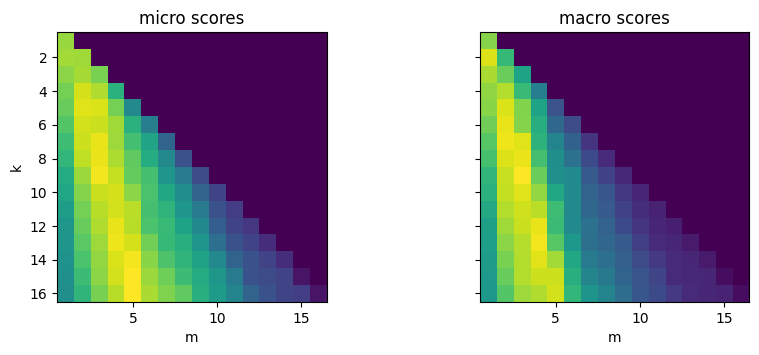

In [92]:
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(10, 3.5), sharey=True)
ax0.imshow(perf_micro)
ax1.imshow(perf_macro)

ax0.set_title("micro scores")
ax0.set_ylabel("k")
ax1.set_title("macro scores")
for ax in [ax0, ax1]:
    ax.set_xlim([0.5, 17 - 0.5])
    ax.set_ylim([17 - 0.5, 0.5])
    ax.set_xlabel("m")
plt.show()

In [93]:
k, m = np.unravel_index(perf_micro.argmax(), perf_micro.shape)
print(f"최상의 k: {k}, 최상의 m: {m}")

최상의 k: 15, 최상의 m: 5


In [94]:
embs_train.drop_index("embedding") # 데이터셋을 슬라이싱하기 전에 FAISS 인덱스는 데이터셋처럼 슬라이싱하지 못하므로 인덱스를 삭제합니다.
test_labels = np.array(embs_test["label_ids"])
test_queries = np.array(embs_test["embedding"], dtype=np.float32)

for train_slice in train_slices:
    # 훈련 슬라이스로부터 FAISS 인덱스를 만듭니다
    embs_train_tmp = embs_train.select(train_slice)
    embs_train_tmp.add_faiss_index("embedding")
    # 검증 세트로 최상의 k, m 값을 구합니다
    perf_micro, _ = find_best_k_m(embs_train_tmp, valid_queries, valid_labels)
    k, m = np.unravel_index(perf_micro.argmax(), perf_micro.shape)
    # 테스트 세트에서 예측을 만듭니다
    _, samples = embs_train_tmp.get_nearest_examples_batch("embedding",
                                                           test_queries,
                                                           k=int(k))
    y_pred = np.array([get_sample_preds(s, m) for s in samples])
    # 예측을 평가합니다
    clf_report = classification_report(test_labels, y_pred,
        target_names=mlb.classes_, zero_division=0, output_dict=True,)
    macro_scores["Embedding"].append(clf_report["macro avg"]["f1-score"])
    micro_scores["Embedding"].append(clf_report["micro avg"]["f1-score"])

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

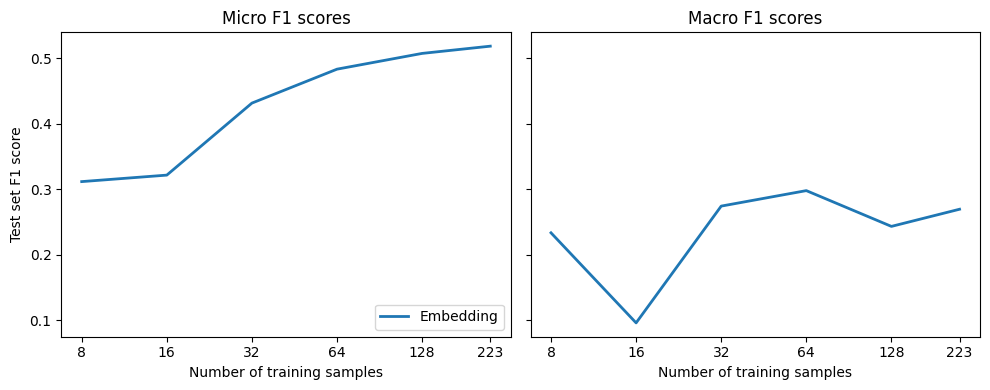

In [95]:
plot_metrics(micro_scores, macro_scores, train_samples, "Embedding")

결과를 저장합니다.

In [28]:
import joblib

joblib.dump({'micro': micro_scores, 'macro': macro_scores}, '09_results_of_faiss.gz')

['09_results_of_faiss.gz']